In [ ]:
###### Before starting install the following packages : pip install git+https://github.com/tensorflow/examples.git

# Image Colorization Project, Mean-Square-Error

In this notebook, our objective is to correctly colorize black and white images. We propose to do this by framing the task as a prediction problem, where given the values of the luminance channel of the picture, we predict the values of the A and B channels, and then reconstruct the image by merging the channels and mapping the picture to RGB for visualization. <br>
In this notebook, we work on the problem as if it was a regression problem, and use the MSE as loss for our CNN. Our objective will therefore be, for each pixel in the image, to obtain the A and B values that minimize the MSE.

In [2]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import tqdm as tqdm
from scipy.ndimage import gaussian_filter
import tensorflow as tf
from tensorflow_examples.models.pix2pix import pix2pix
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Concatenate, Conv2DTranspose
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from Functions.DataLoader import data_generator
from Models.MSE_model import buildresnet_model, buildresnet_from_weights
from Functions.Visualization import MSE_plot_predicted_image, MSE_plot_predicted_image_historical

# COCO Dataset

We start our analysis by working on the Microsoft COCO Dataset. This dataset comprises thousands of images of people, landscapes, objects and animals, therefore it seemed like the perfect dataset to build a strong model that can generalize well to many different picture subjects. <br>
More specifically, our version of the dataset contains 40k images.
In the following cells, we show some sample images.

# FILES IN DIRECTORY: 40762


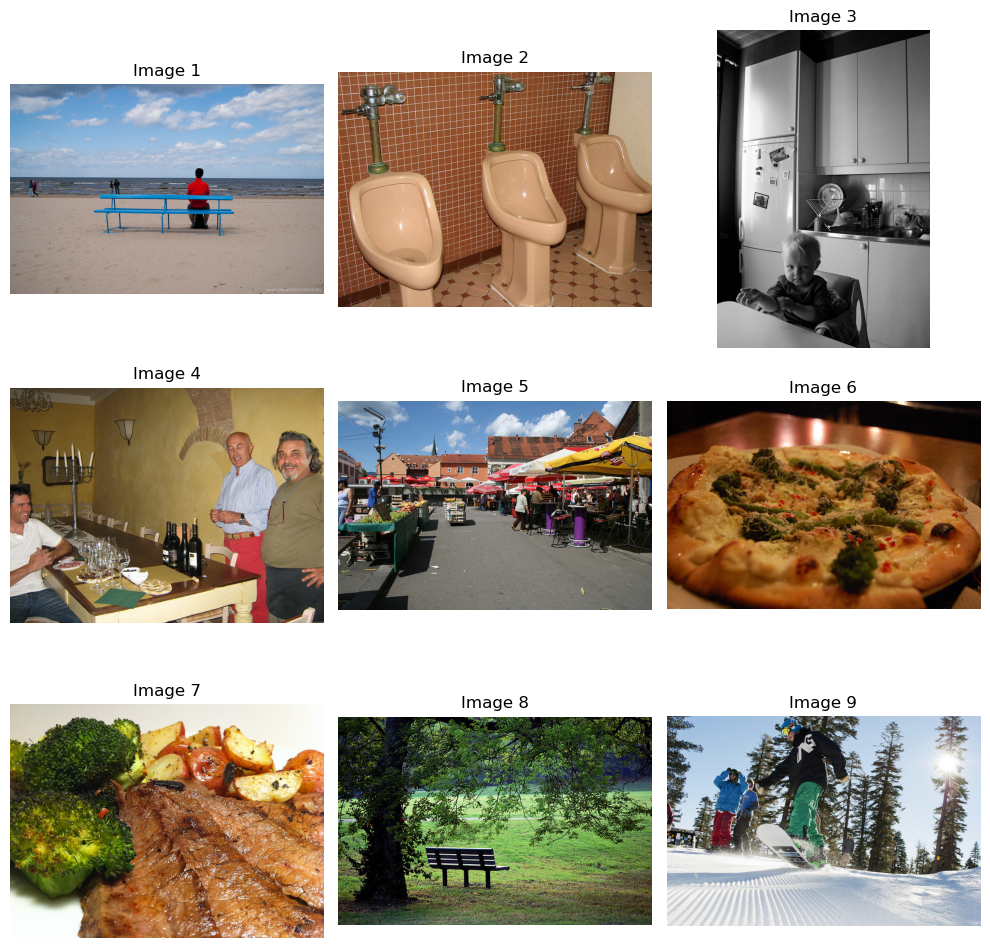

In [2]:
data_dir = 'Data/COCO'
files = os.listdir(data_dir)
print(f"# FILES IN DIRECTORY: {len(files)}")

image_paths = [os.path.join(data_dir, file) for file in files[:9]]
fig, axs = plt.subplots(3, 3, figsize=(10, 10))

for i, ax in enumerate(axs.flat):
    image = cv2.imread(image_paths[i])[:, :, ::-1] #cv2 opens images in BGR
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(f'Image {i+1}')

plt.tight_layout()
plt.show()

As we can notice, the images depict various subjects, with different lighting conditions and different perspectives, therefore they are perfect to create a very general model. 

# PEOPLE Dataset

The second part of our analysis will be carried out on a dataset we found at the link _http://chenlab.ece.cornell.edu/people/Andy/ImagesOfGroups.html_, and it is composed of group pictures, family pictures and pictures of weddings. <br>
We decided to also use this dataset because we found that the COCO dataset was a bit biased towards landscapes and objects, and did not contain enough images of people.

# FILES IN DIRECTORY: 1321


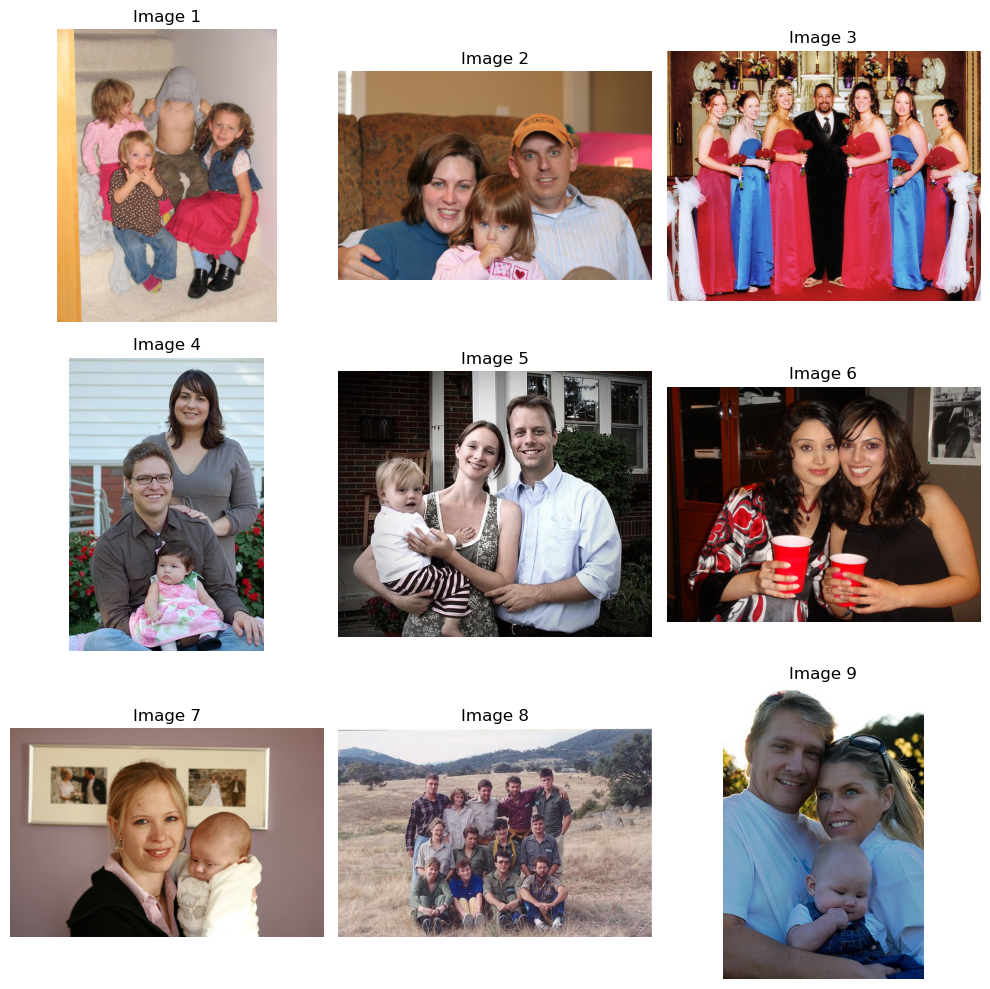

In [3]:
data_dir = 'Data/PEOPLE'
files = os.listdir(data_dir)
print(f"# FILES IN DIRECTORY: {len(files)}")

image_paths = [os.path.join(data_dir, file) for file in files[:9]]
fig, axs = plt.subplots(3, 3, figsize=(10, 10))

for i, ax in enumerate(axs.flat):
    image = cv2.imread(image_paths[i])[:, :, ::-1] #cv2 opens images in BGR
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(f'Image {i+1}')

plt.tight_layout()
plt.show()

# Preprocessing and Data Loader

To train the model we use a data generator which we defined, and that can be found in the *Functions* subdirectory. <br>
This function extracts some pictures from the data directory, converts them from RGB to LAB format, splits the channels and builds the X and y matrices that will be used in training. Furthermore, it casts them into the appropriate shapes required by the Neural Network.

The **data_generator** function takes as input 6 parameters:
- the data directory (data_dir) from which to extract the pictures
- the batch size (in our notebooks, set to 32)
- the start index in the data directory and the size of the set from which to select the images (i.e. if the start index is 0 and the size is 32000, the dataloader will output images taken from data_dir, between the 0-th and the 32000-th image)
- the height and width of the images (since images have various sizes in the dataset, we resize them to our desired size)

The data is returned as a tuple of objects, where the first entry is the X set, while the second is the y set, in the correct shape to feed them into the Neural Network.

In [4]:
height, width = 224, 224
train_data = data_generator(data_dir, 32, 0, 32000, height, width)
val_data = data_generator(data_dir, 32, 32000, 2000, height, width)
print(f'Shape of X set: {next(train_data)[0].shape}\nShape of y set: {next(train_data)[1].shape}')

Shape of X set: (32, 224, 224, 3)
Shape of y set: (32, 224, 224, 2)


Both the X and y set contain 32 images, and for each image we have 224x224 pixels. The X set has 3 channels per pixel, which are simply the L channel (luminance) repeated 3 times to obtain an RGB black and white image to feed to the pretrained network we will use. <br>
The y set instead has 2 channels per pixel, which are the A and B channels of the LAB color scheme. 

# Model Definition

In this short subsection, we call a function defined in the "Models" subdirectory, which essentially builds the resnet model given an input size and the number of output channels. <br>
The model is composed of 2 different blocks: one encoder and one decoder, with encoding layers connected to decoding layers with skip connects, effectively imitating a UNet architecture. <br>
The encoder part of the network is a ResNet50 model pretrained on the ImageNet dataset, while the decoder part was implemented by us using some upsampling blocks imported from the pix2pix Github directory. Finally, we added a transpose convolutional layer with two output channels at the end, in order to get two 224x224 predictions (one for the A and one for the B channel). 

In [5]:
resnet_model = buildresnet_model([224,224, 3], 2)
resnet_model.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_1        │ [(None, 112, 112, │ 23,587,712 │ input_layer_1[0]… │
│ (Functional)        │ 64), (None, 56,   │            │                   │
│                     │ 56, 256), (None,  │            │                   │
│                     │ 28, 28, 512),     │            │                   │
│                     │ (None, 14, 14,    │            │                   │
│                     │ 1024), (None, 7,  │            │                   │
│                     │ 7, 2048)]         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 14, 14,    │  9,439,232 │ functional_1[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 14, 14,    │          0 │ sequential[0][0], │
│ (Concatenate)       │ 1536)             │            │ functional_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 28, 28,    │  3,539,968 │ concatenate[0][0] │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 28, 28,    │          0 │ sequential_1[0][… │
│ (Concatenate)       │ 768)              │            │ functional_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 56, 56,    │    885,248 │ concatenate_1[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 56, 56,    │          0 │ sequential_2[0][… │
│ (Concatenate)       │ 384)              │            │ functional_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 112, 112,  │    221,440 │ concatenate_2[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 112, 112,  │          0 │ sequential_3[0][… │
│ (Concatenate)       │ 128)              │            │ functional_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_4  │ (None, 224, 224,  │      2,306 │ concatenate_3[0]… │
│ (Conv2DTranspose)   │ 2)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 37,675,906 (143.72 MB)

 Trainable params: 14,086,274 (53.73 MB)

 Non-trainable params: 23,589,632 (89.99 MB)

# Model Training and Finetuning

In the following cell, we show the code we used to perform the training of our models. <br>
Given the high computational cost of this training on the COCO dataset (on a M1 Macbook Air, an epoch takes roughly 1h to train), we trained the models using an Azure server, and therefore the following cell was not run. <br>
The trainings were composed of two steps: first, we froze the ResNet50 layers and only trained the upsampling layers and the final layers. Then we unfroze the ResNet50 layers and performed a finetuning on the whole model. <br>
We show in the following cells the code used to train and finetune the model on the COCO dataset, where to show the finetuning part we import the COCO model we trained on the server.

In [ ]:
data_dir = 'Data/COCO'
train_data = data_generator(data_dir, 32, 0, 32000, height, width)
val_data = data_generator(data_dir, 32, 32000, 2000, height, width)

resnet_model.compile(optimizer='adam', loss='mse')
early_stopping = EarlyStopping(monitor='val_loss',
                                   patience = 5,
                                   mode='min',
                                   verbose=1,
                                   min_delta=0.1)

history = resnet_model.fit(train_data,
                    epochs = 100,
                    steps_per_epoch = 1000,   # 1000 batches * 32 images/batch = 32000 images
                    validation_data = val_data,
                    validation_steps = 62,    # 62 batches * 32 images/batch = roughly 2000 images
                    callbacks = [early_stopping],
                    verbose = 1)

In [ ]:
finetuned_resnet_model = buildresnet_model([224,224, 3], 2)
finetuned_resnet_model.load_weights('')  # Insert Model weights to perform finetuning
for layer in finetuned_resnet_model.layers:
    layer.trainable = True

resnet_model.compile(optimizer='adam', loss='mse')
early_stopping = EarlyStopping(monitor='val_loss',
                                   patience = 5,
                                   mode='min',
                                   verbose=1,
                                   min_delta=0.1)

history = resnet_model.fit(train_data,
                    epochs = 100,
                    steps_per_epoch = 1000,   # 1000 batches * 32 images/batch = 32000 images
                    validation_data = val_data,
                    validation_steps = 62,    # 62 batches * 32 images/batch = roughly 2000 images
                    callbacks = [early_stopping],
                    verbose = 1)

# Model Evaluation

We present and evaluate 4 models:
- Model trained and finetuned on 40k images of the COCO dataset (**Model1**)
- Model trained (but not finetuned) on 40k images of the COCO dataset (**Model2**)
- Model trained and finetuned on 5k images of the People dataset (**Model3**)
- Model trained and finetuned on 1k images of the People dataset (**Model4**)

Instead of relying on a numerical loss value, which carries little meaning in a task like image colorization, we evaluate our model based on how realistic the reconstructed images appear to the human eye. <br>
Please note that all the images which will be displayed in the next cells will have 3 columns, where the first is the original image, the second is the grayscale version of the original image, and the thirds is the predicted one.

In [3]:
model1 = buildresnet_from_weights((224, 224, 3), 2, True, 'TrainedModels/finetuned_224_resnet_40000.h5')
model2 = buildresnet_from_weights((224, 224, 3), 2, False, 'TrainedModels/224_resnet_40000.h5')
model3 = buildresnet_from_weights((224, 224, 3), 2, True, 'TrainedModels/finetuned_people_resnet.h5')

## Evaluation on COCO

In [137]:
evaluation_data = data_generator('Data/TEST_DATA/coco', 10, 0, 10, 224, 224)
data = next(evaluation_data)
predictions1 = model1.predict(data[0])
predictions2 = model2.predict(data[0])
predictions3 = model3.predict(data[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 762ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step


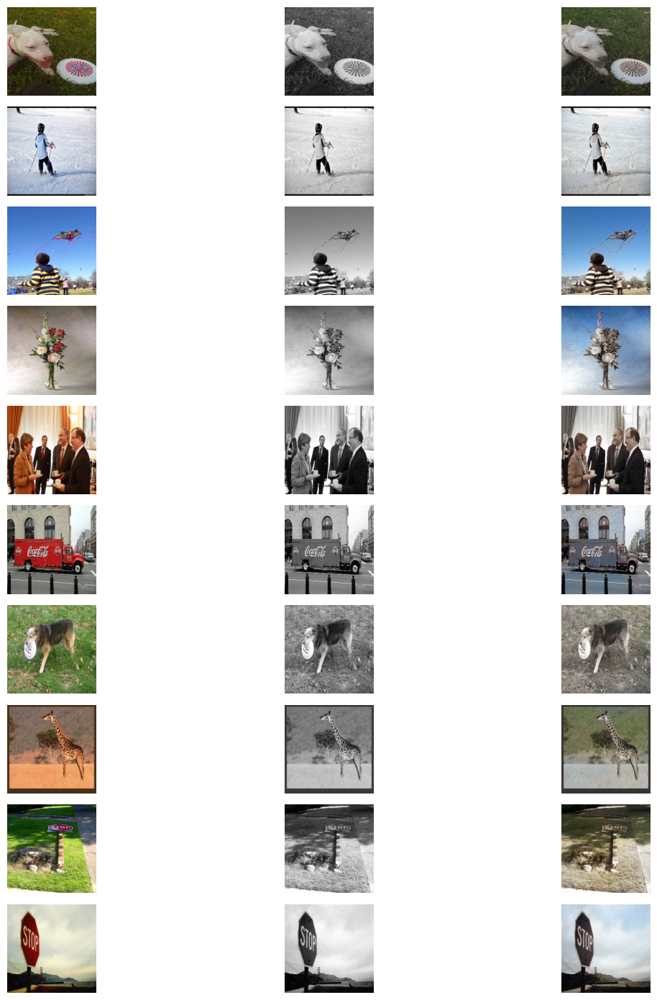

In [138]:
MSE_plot_predicted_image(data, predictions1)

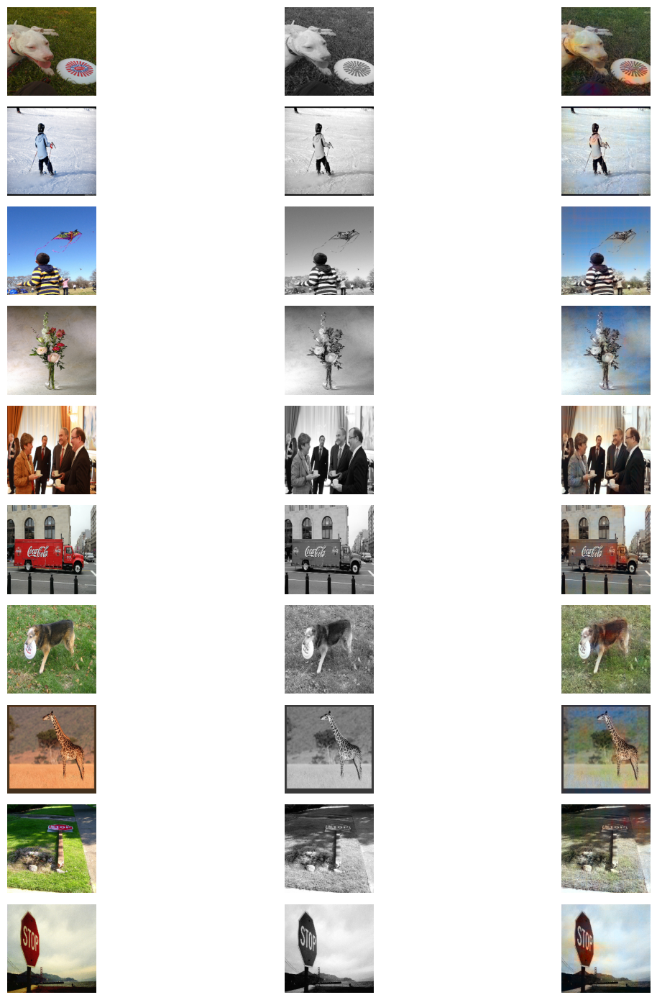

In [139]:
MSE_plot_predicted_image(data, predictions2)

As we can see from the above results, the model which was trained on 40k images but not finetuned (model2) generally colors images with brighter colors, whereas the finetuned model tends to color images with desaturated colors. On the other hand, the finetuned model is much more precise in coloring images inside their contours, and rarely has random splashed of color on the image like the not finetuned model has.

## Evaluation on PEOPLE

In [141]:
evaluation_data = data_generator('Data/TEST_DATA/PEOPLE_TEST', 10, 0, 10, 224, 224)
data = next(evaluation_data)
predictions1 = model1.predict(data[0])
predictions2 = model2.predict(data[0])
predictions3 = model3.predict(data[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 619ms/step


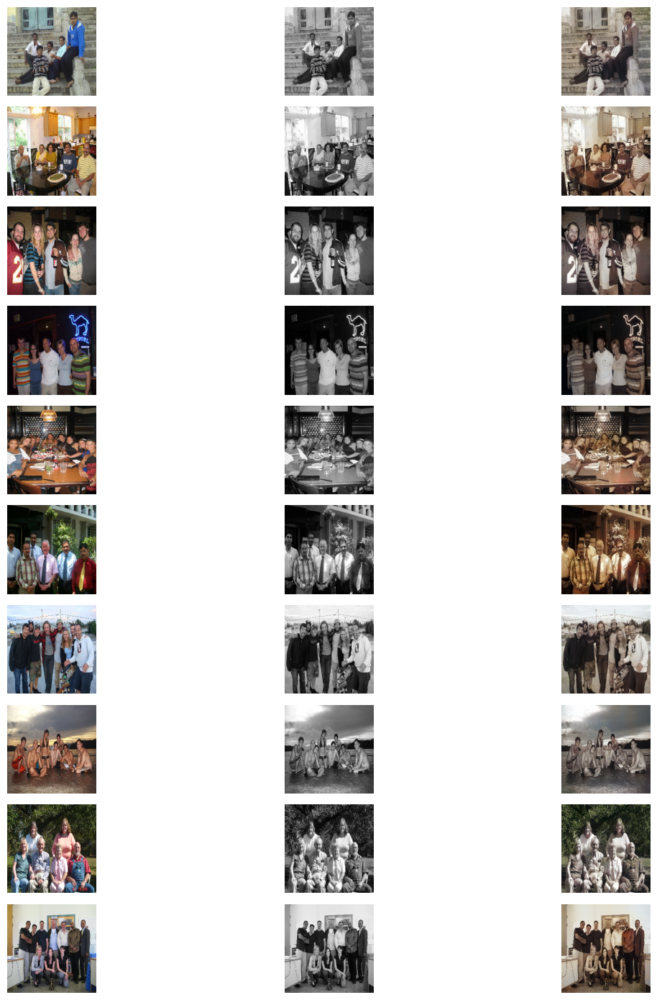

In [142]:
MSE_plot_predicted_image(data, predictions1)

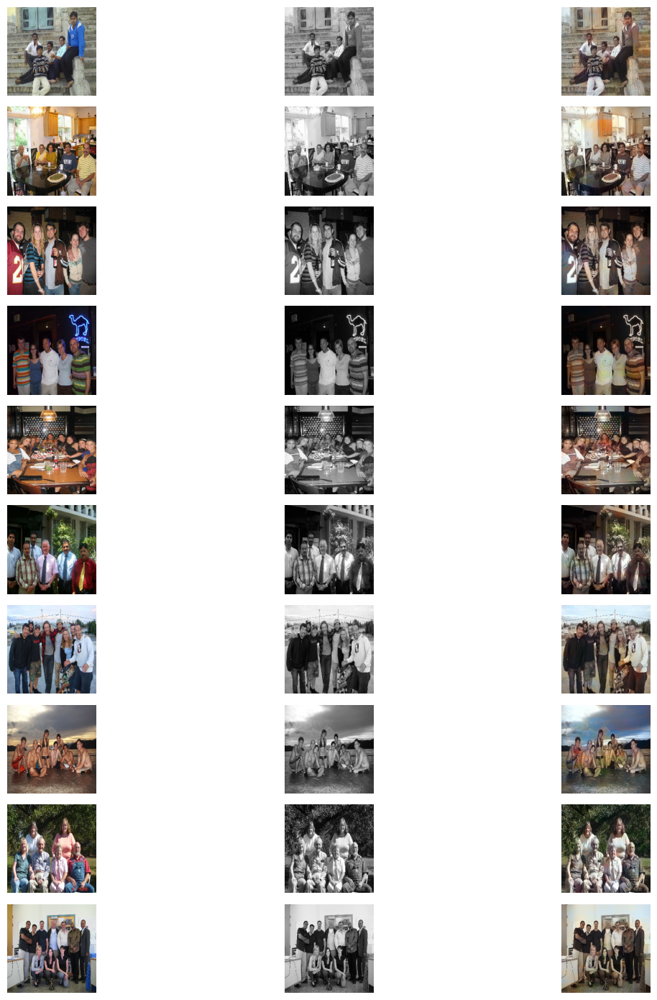

In [143]:
MSE_plot_predicted_image(data, predictions2)

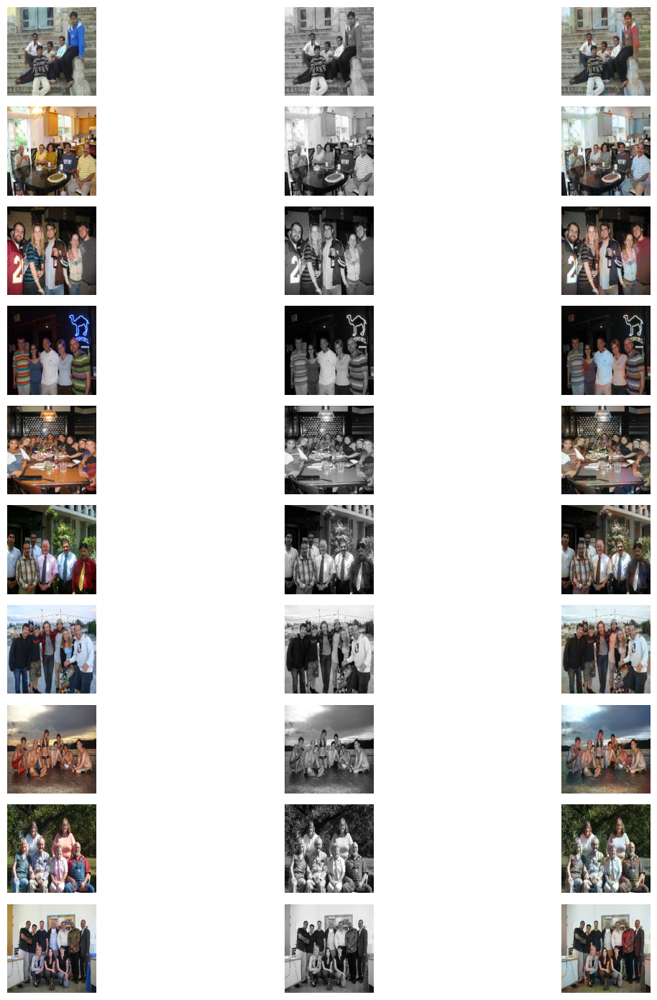

In [144]:
MSE_plot_predicted_image(data, predictions3)

What we can see from the results above is that the finetuned model on the COCO dataset has the same problems as on the other dataset, namely the fact that images are colored with desaturated colors, mainly sepia and gray, so people look either unnaturally pale or yellow. <br>
The not finetuned model trained on the COCO dataset (model2) once again colors the images with bright colors, and actually does a good job coloring the people in the pictures, again at the cost of color instability and splashes of random colors on the image. <br>
The model trained on 1k images from the People dataset instead performs much better than the others in this case, as one would expect, since it was trained on images similar to the ones it is being tested on. Nonetheless, most of the predictions have bright colors and precise countours, along with great background coloring. <br>

## Evaluation on Historical Images

In [149]:
evaluation_data = data_generator('Data/TEST_DATA/historical', 10, 0, 10, 224, 224)
data = next(evaluation_data)
predictions1 = model1.predict(data[0])
predictions2 = model2.predict(data[0])
predictions3 = model3.predict(data[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


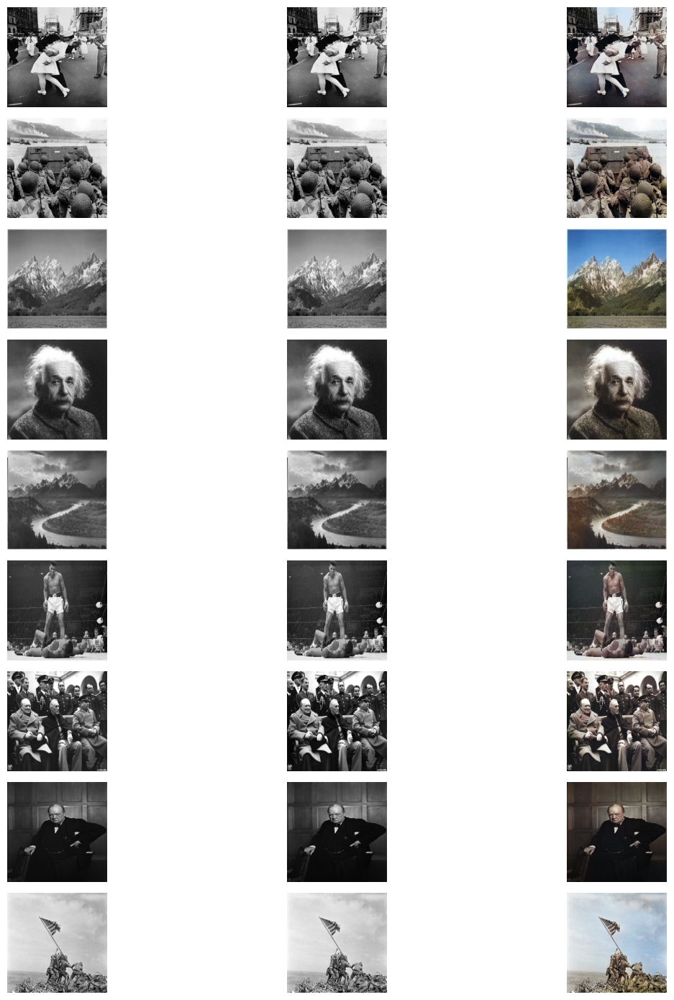

In [150]:
MSE_plot_predicted_image(data, predictions1)

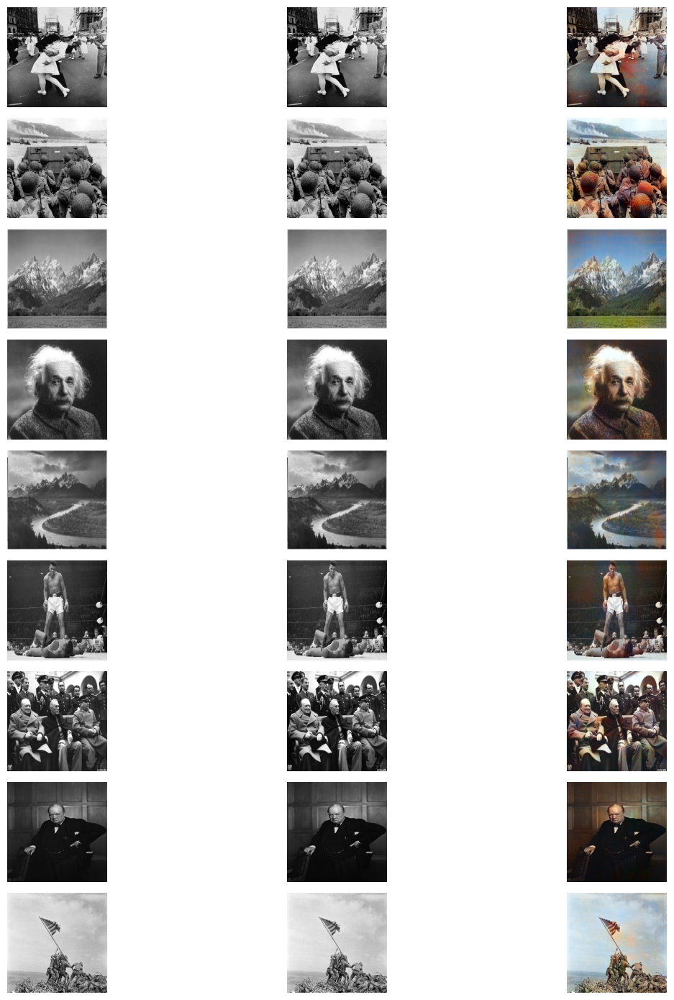

In [151]:
MSE_plot_predicted_image(data, predictions2)

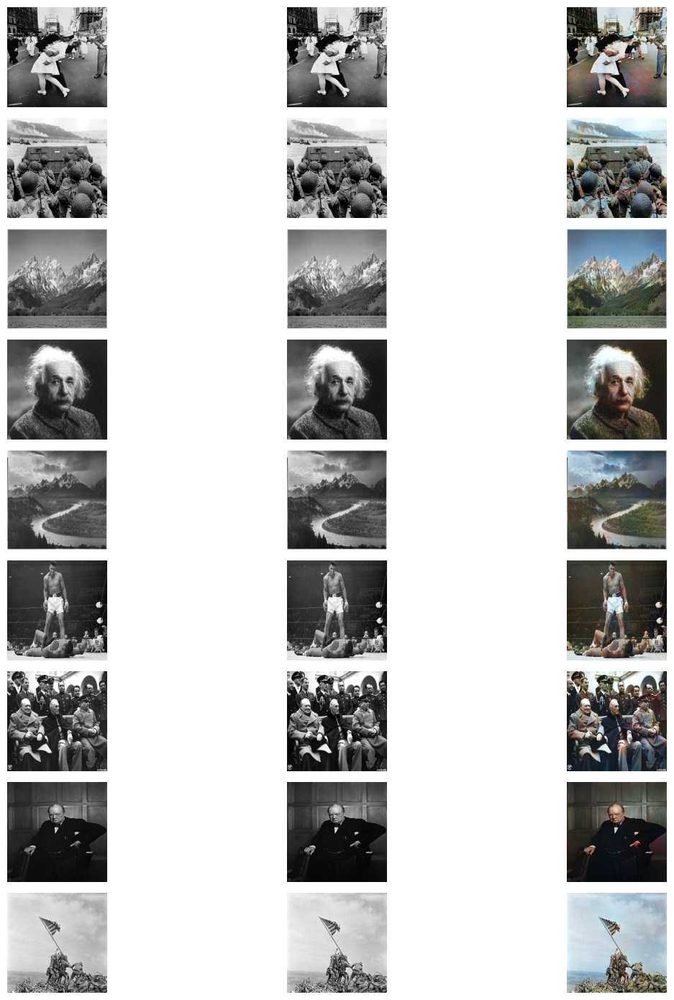

In [152]:
MSE_plot_predicted_image(data, predictions3)

Looking at the results on historical images, we can be satisfied by the models we built. In particular, the People model is the one that performs better, since it is finetuned on pictures of people. One unexpected consequence of the fact that it was trained on portraits of people is that the model also learnt very well to recognize and color landscapes, which are often in the background of pictures. <br>
The finetuned COCO model, which is supposed to be the most general one, struggles at coloring the historical pictures (aside from one landscape), and mostly colors the images with desaturated colors. This happens because colors are not evenly represented in training images, with green and light blue being very frequent (in grass and skies), whereas bright colors like red and blue are quite rare, so the model correctly colors skies and grass, but struggles with people, shirts and other objects. Furthermore, the MSE favors mild colors, which have short "distance" to all other colors, so desaturated colors like gray and light brown.